In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
%matplotlib inline

In [2]:
from google.colab import files
files.upload()

Saving weatherAUS.csv to weatherAUS.csv


{'weatherAUS.csv': b'Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow\n2008-12-01,Albury,13.4,22.9,0.6,NA,NA,W,44,W,WNW,20,24,71,22,1007.7,1007.1,8,NA,16.9,21.8,No,No\n2008-12-02,Albury,7.4,25.1,0,NA,NA,WNW,44,NNW,WSW,4,22,44,25,1010.6,1007.8,NA,NA,17.2,24.3,No,No\n2008-12-03,Albury,12.9,25.7,0,NA,NA,WSW,46,W,WSW,19,26,38,30,1007.6,1008.7,NA,2,21,23.2,No,No\n2008-12-04,Albury,9.2,28,0,NA,NA,NE,24,SE,E,11,9,45,16,1017.6,1012.8,NA,NA,18.1,26.5,No,No\n2008-12-05,Albury,17.5,32.3,1,NA,NA,W,41,ENE,NW,7,20,82,33,1010.8,1006,7,8,17.8,29.7,No,No\n2008-12-06,Albury,14.6,29.7,0.2,NA,NA,WNW,56,W,W,19,24,55,23,1009.2,1005.4,NA,NA,20.6,28.9,No,No\n2008-12-07,Albury,14.3,25,0,NA,NA,W,50,SW,W,20,24,49,19,1009.6,1008.2,1,NA,18.1,24.6,No,No\n2008-12-08,Albury,7.7,26.7,0,NA,NA,W,35,SSE,W,6,17,48,19,1013.4,1010.1,NA,N

In [3]:
df = pd.read_csv('weatherAUS.csv')
df.columns = df.columns.str.strip()

# Data Inspection

In [4]:
df.iloc[:10,:11]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,W
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,SSE


In [5]:
df.iloc[:10,11:]

,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,15.0,11.0,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


Data terdiri dari 23 kolom. Pada inspeksi awal terdapat beberapa data dengan missing value

In [6]:
df['Date'] = pd.to_datetime(df['Date'])

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           145460 non-null  datetime64[ns]
 1   Location       145460 non-null  object        
 2   MinTemp        143975 non-null  float64       
 3   MaxTemp        144199 non-null  float64       
 4   Rainfall       142199 non-null  float64       
 5   Evaporation    82670 non-null   float64       
 6   Sunshine       75625 non-null   float64       
 7   WindGustDir    135134 non-null  object        
 8   WindGustSpeed  135197 non-null  float64       
 9   WindDir9am     134894 non-null  object        
 10  WindDir3pm     141232 non-null  object        
 11  WindSpeed9am   143693 non-null  float64       
 12  WindSpeed3pm   142398 non-null  float64       
 13  Humidity9am    142806 non-null  float64       
 14  Humidity3pm    140953 non-null  float64       
 15  

In [8]:
df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

Data memiliki banyak data missing. Dilanjutkan dengan msno untuk mengecek apakah terdapat pola dalam data yang missing

<Axes: >

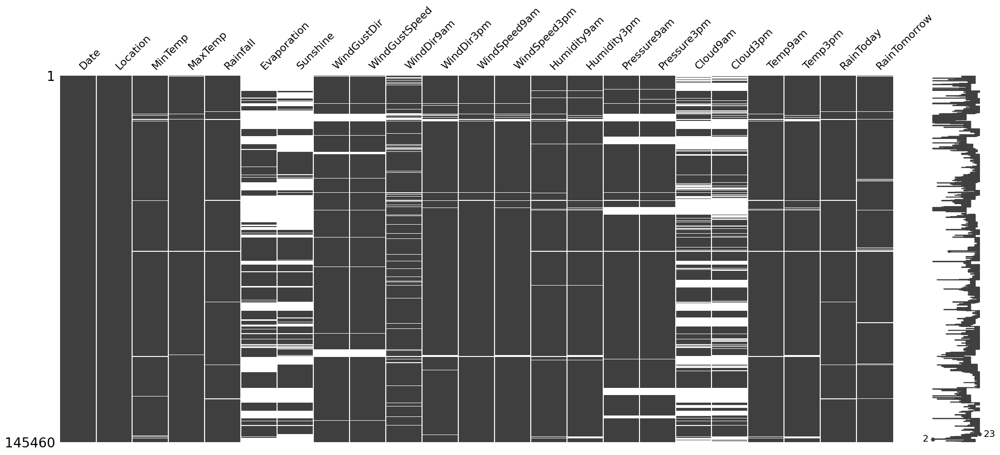

In [9]:
msno.matrix(df)

Data yang missing cenderung memiliki cluster missing tertentu dengan pola missing yang memiliki kemiripan pada fitur evaporation, sunshine. cloud9am, dan cloud 3pm. Karena data diurutkan bedasarkan tanggal dan lokasi. dilakukan pengecekan data missing berdasarkan lokasi

In [10]:
grouped = df.groupby('Location')

for location, group in grouped:
  print(location, " ", len(group))
  print(group.isnull().sum(), "\n")

Adelaide   3193
Date                0
Location            0
MinTemp             2
MaxTemp             3
Rainfall          102
Evaporation      1489
Sunshine         1424
WindGustDir        26
WindGustSpeed      26
WindDir9am        274
WindDir3pm         16
WindSpeed9am        5
WindSpeed3pm        5
Humidity9am         5
Humidity3pm         5
Pressure9am         8
Pressure3pm         7
Cloud9am         3193
Cloud3pm         3193
Temp9am             5
Temp3pm             4
RainToday         102
RainTomorrow      103
dtype: int64 

Albany   3040
Date                0
Location            0
MinTemp            63
MaxTemp            54
Rainfall           24
Evaporation       290
Sunshine          520
WindGustDir      3040
WindGustSpeed    3040
WindDir9am        247
WindDir3pm        783
WindSpeed9am       61
WindSpeed3pm      733
Humidity9am        49
Humidity3pm       716
Pressure9am        25
Pressure3pm        25
Cloud9am           38
Cloud3pm          711
Temp9am            39
Temp3pm  

Sebagian data memiliki data missing yang cukup besar pada kolom evaporation, sunshine. cloud9am, dan cloud3pm dengan beberapa lokasi tidak memiliki pencatatan terhadap data tersebut sama sekali. Terdapat beberapa lokasi dengan data missing yang sedikit seperti Perth dan MelbourneAirport.

Terdapat beberapa lokasi dengan jumlah entry yang tidak sama. Dilakukan pengecekan apakah terdapat tanggal yang tidak tercatat

In [11]:
complete_loc = []

for location, group in grouped:
  first_date = group['Date'].min()
  last_date = group['Date'].max()

  date_range = pd.date_range(start=first_date, end=last_date)

  missing_dates = date_range[~date_range.isin(group['Date'])]

  print(f"Missing dates in {location} between {first_date} - {last_date} : {len(missing_dates)}")

  if len(missing_dates) > 0:
      print(missing_dates)
  else:
      print(f"No missing dates in {location}")
      complete_loc.append(location)
  print("\n")

print(f"City with complete dates ", complete_loc)

Missing dates in Adelaide between 2008-07-01 00:00:00 - 2017-06-25 00:00:00 : 89
DatetimeIndex(['2011-04-01', '2011-04-02', '2011-04-03', '2011-04-04',
               '2011-04-05', '2011-04-06', '2011-04-07', '2011-04-08',
               '2011-04-09', '2011-04-10', '2011-04-11', '2011-04-12',
               '2011-04-13', '2011-04-14', '2011-04-15', '2011-04-16',
               '2011-04-17', '2011-04-18', '2011-04-19', '2011-04-20',
               '2011-04-21', '2011-04-22', '2011-04-23', '2011-04-24',
               '2011-04-25', '2011-04-26', '2011-04-27', '2011-04-28',
               '2011-04-29', '2011-04-30', '2012-12-01', '2012-12-02',
               '2012-12-03', '2012-12-04', '2012-12-05', '2012-12-06',
               '2012-12-07', '2012-12-08', '2012-12-09', '2012-12-10',
               '2012-12-11', '2012-12-12', '2012-12-13', '2012-12-14',
               '2012-12-15', '2012-12-16', '2012-12-17', '2012-12-18',
               '2012-12-19', '2012-12-20', '2012-12-21', '2012-12-2

Hampir semua kota tidak memiliki tanggal yang lengkap. Beberapa kota dengan tanggal yang lengkap adalah Katherine, Nhil, dan Uluru.

Untuk keperluan storytelling ini fitur yang digunakan akan dibatasi menjadi MinTemp, MaxTemp, Rainfall, Evaporation, dan Sunshine. Hal tersebut didasarkan karena hal tersebut adalah hal yang paling berpengaruh terhadap kehidupan sehari-hari dan yang umumnya paling berpengaruh terhadap cuaca. Digunakan lokasi Perth karena data missing yang cenderung sedikit

# Data Preprocessing

In [12]:
data = df[df['Location'] == 'Perth']

data.reset_index(drop=True, inplace=True)

data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-07-01,Perth,2.7,18.8,0.0,0.8,9.1,ENE,20.0,NaN,...,97.0,53.0,1027.6,1024.5,2.0,3.0,8.5,18.1,No,No
1,2008-07-02,Perth,6.4,20.7,0.0,1.8,7.0,NE,22.0,ESE,...,80.0,39.0,1024.1,1019.0,0.0,6.0,11.1,19.7,No,No
2,2008-07-03,Perth,6.5,19.9,0.4,2.2,7.3,NE,31.0,NaN,...,84.0,71.0,1016.8,1015.6,1.0,3.0,12.1,17.7,No,Yes
3,2008-07-04,Perth,9.5,19.2,1.8,1.2,4.7,W,26.0,NNE,...,93.0,73.0,1019.3,1018.4,6.0,6.0,13.2,17.7,Yes,Yes
4,2008-07-05,Perth,9.5,16.4,1.8,1.4,4.9,WSW,44.0,W,...,69.0,57.0,1020.4,1022.1,7.0,5.0,15.9,16.0,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3188,2017-06-21,Perth,10.3,19.9,0.2,1.8,7.5,NW,37.0,NNE,...,89.0,60.0,1017.1,1013.8,5.0,6.0,13.0,18.5,No,Yes
3189,2017-06-22,Perth,13.0,16.8,61.2,3.6,0.0,SSW,46.0,W,...,90.0,75.0,1005.6,1008.9,7.0,7.0,16.4,15.6,Yes,No
3190,2017-06-23,Perth,13.3,18.9,0.4,1.8,6.5,SE,37.0,SE,...,85.0,65.0,1019.2,1019.4,6.0,6.0,15.1,18.0,No,No
3191,2017-06-24,Perth,11.5,18.2,0.0,3.8,9.3,SE,30.0,ESE,...,62.0,47.0,1025.9,1023.4,1.0,3.0,14.0,17.6,No,No


In [13]:
columns_to_keep = ['Date' ,'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine']
columns_to_drop = data.columns.difference(columns_to_keep)

data = data.drop(columns=columns_to_drop)

data

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine
0,2008-07-01,2.7,18.8,0.0,0.8,9.1
1,2008-07-02,6.4,20.7,0.0,1.8,7.0
2,2008-07-03,6.5,19.9,0.4,2.2,7.3
3,2008-07-04,9.5,19.2,1.8,1.2,4.7
4,2008-07-05,9.5,16.4,1.8,1.4,4.9
...,...,...,...,...,...,...
3188,2017-06-21,10.3,19.9,0.2,1.8,7.5
3189,2017-06-22,13.0,16.8,61.2,3.6,0.0
3190,2017-06-23,13.3,18.9,0.4,1.8,6.5
3191,2017-06-24,11.5,18.2,0.0,3.8,9.3


In [14]:
date_range = pd.date_range(start=data['Date'].min(), end=data['Date'].max(), freq='D')

data = data.set_index('Date').reindex(date_range)

data.reset_index(inplace=True)
data.rename(columns={'index': 'Date'}, inplace=True)

data

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine
0,2008-07-01,2.7,18.8,0.0,0.8,9.1
1,2008-07-02,6.4,20.7,0.0,1.8,7.0
2,2008-07-03,6.5,19.9,0.4,2.2,7.3
3,2008-07-04,9.5,19.2,1.8,1.2,4.7
4,2008-07-05,9.5,16.4,1.8,1.4,4.9
...,...,...,...,...,...,...
3277,2017-06-21,10.3,19.9,0.2,1.8,7.5
3278,2017-06-22,13.0,16.8,61.2,3.6,0.0
3279,2017-06-23,13.3,18.9,0.4,1.8,6.5
3280,2017-06-24,11.5,18.2,0.0,3.8,9.3


Mengisi data dengan data yang kosong dengan data null yang kemudian akan diisi dengan rolling average mengingat data merupakan data temporal

In [15]:
columns_to_fill = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine']

for column in columns_to_fill:
    data[column] = data[column].fillna(data[column].rolling(window=41, min_periods=2).mean())

In [16]:
data.isnull().sum()

Date           0
MinTemp        0
MaxTemp        0
Rainfall       0
Evaporation    0
Sunshine       0
dtype: int64

In [17]:
start_date = '2009-01-01'
end_date = '2016-12-31'

clean_df = data[(data['Date'] >= start_date) & (data['Date'] <= end_date)]

clean_df.reset_index(drop=True, inplace=True)

Data yang digunakan adalah data 2009-2016 mengingat akan diperlukan data penuh untuk setiap tahunnya

In [22]:
smoothed_df = clean_df.copy(deep=True)

for column in columns_to_fill:
    smoothed_df[column] = smoothed_df[column].rolling(window=30, min_periods=1).mean()

Data di smoothing untuk mempermudah melihat pola data yang ada

# Data Visualization

In [23]:
smoothed_df['Year'] = smoothed_df['Date'].dt.year
smoothed_df['DayOfYear'] = smoothed_df['Date'].dt.dayofyear - smoothed_df['Date'].dt.dayofyear.min()

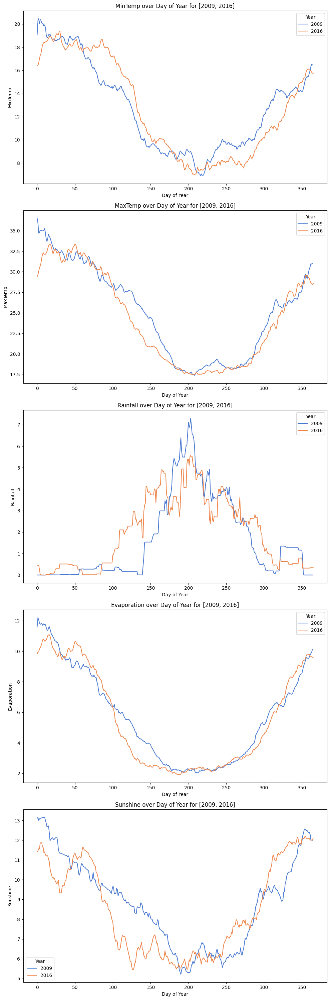

In [29]:
years_to_show = [2009, 2016]

filtered_df = smoothed_df[smoothed_df['Year'].isin(years_to_show)]

fig, axes = plt.subplots(nrows=len(columns_to_fill), ncols=1, figsize=(10, 6 * len(columns_to_fill)))

for i, column in enumerate(columns_to_fill):
    filtered_df = smoothed_df[smoothed_df['Year'].isin(years_to_show)]

    sns.lineplot(data=filtered_df, x='DayOfYear', y=column, hue='Year', palette='muted', ax=axes[i])

    axes[i].set_title(f'{column} over Day of Year for {years_to_show}')
    axes[i].set_xlabel('Day of Year')
    axes[i].set_ylabel(column)
    axes[i].legend(title='Year')

plt.tight_layout()
plt.show()

Data diatas menunjukkan bahwa telah terjadi perbedaan pola musim tahunan dari tahun 2009 dan 2016. Dari hasil visualisasi diatas dapat dilihat bahwa dibandingkan dengan tahun 2009, musim hujan di tahun 2016 berlangsung lebih lama. Hal ini juga berpengaruh pada hal lain seperti jumlah terik matahari per hari yang jauh menurun. Suhu maksimal yang tercatat juga terpengaruh oleh musim hujan yang berlangsung lebih lama, dapat dilihat bahwa suhu tertinggi pada tahun 2016 yang tercatat memiliki periode rendah yang lebih lama dibandingkan tahun 2009. Meskipun demikian suhu terendah yang tercatat tidak memiliki perbedaan signifikan pada tahun 2009 dan 2006

Meskipun musim hujan berlangsung lebih lama, perlu diperhatikan bahwa curah hujan pada 2016 cenderung tidak seekstrem pada tahun 2009.